# Desarrollo de algoritmos BioInspirados

Alberto Rodríguez Reyes         Matricula: A01383805

Luis Fernando Alcázar Díaz      Matricula: A00836287

Asgard Andrés Mendoza Flores    Matricula: A00572566

Pedro Soto Juárez			          Matricula: A00837560



## Problematica
El Problema del Agente Viajero (TSP), hace referencia a la problemática de encontrar la ruta más corta y, al mismo tiempo, la más eficiente, para llegar a un destino.

## Presentacion de la informacion

In [ ]:
# Preparacion
# ---- ---- ----
!pip install contextily
# ---- ---- ----


In [ ]:
from google.colab import drive
import pandas as pd
import time
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import random
import contextily as ctx
import numpy as np
import time

ModuleNotFoundError: No module named 'contextily'

In [ ]:
# Montar Google Drive
drive.mount('/content/gdrive')

NameError: name 'drive' is not defined

In [ ]:
# Paso 1: Cargar el archivo CSV
csv_file = '/content/gdrive/MyDrive/DireccionesSP/TSP_SP_REAL.csv'
df = pd.read_csv(csv_file)

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_1.csv


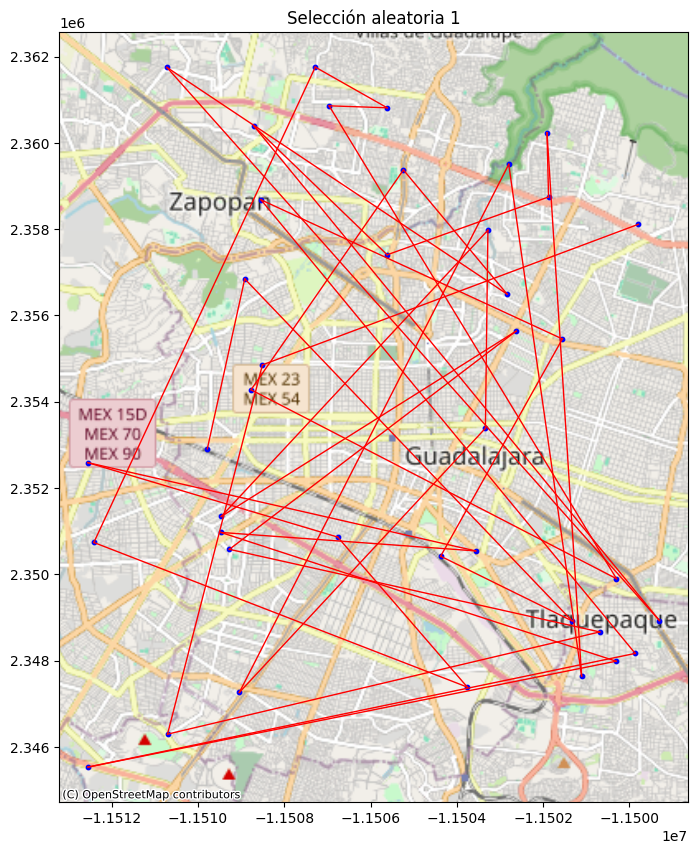

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_2.csv


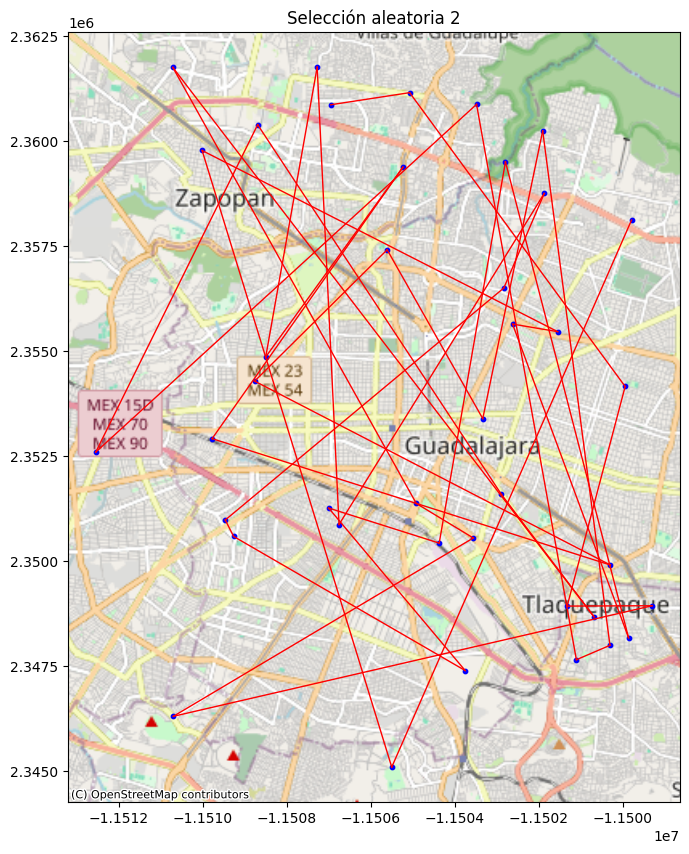

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_3.csv


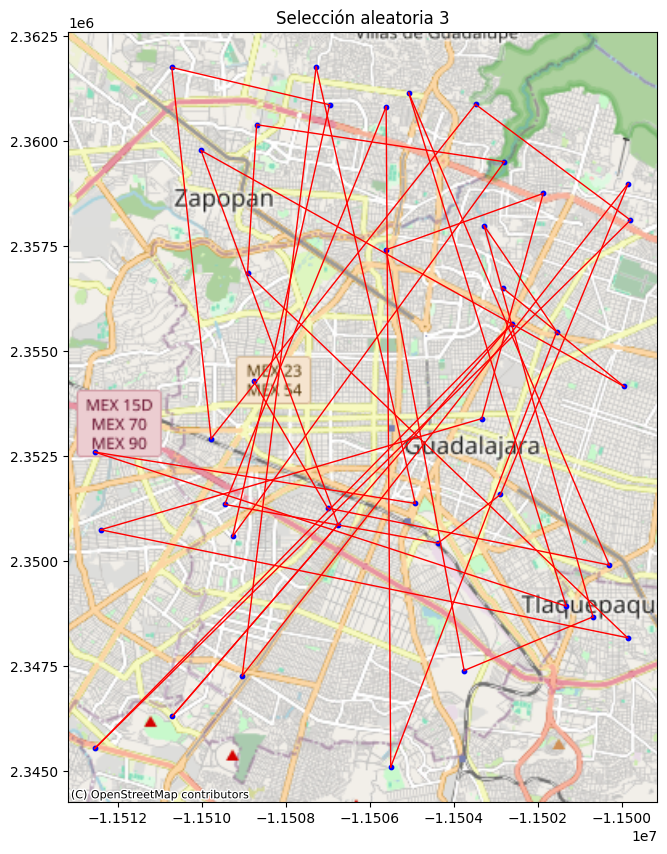

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_4.csv


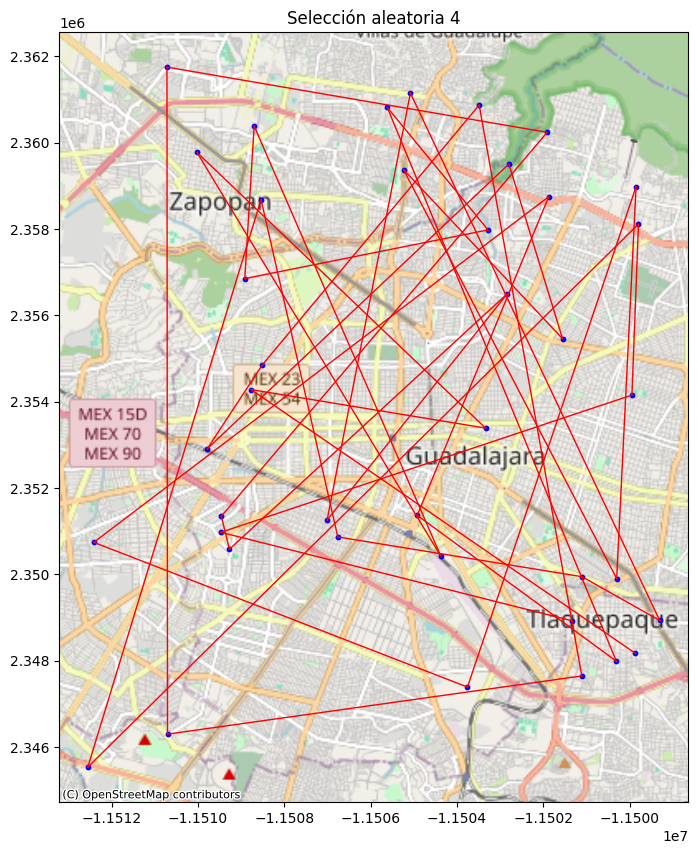

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_5.csv


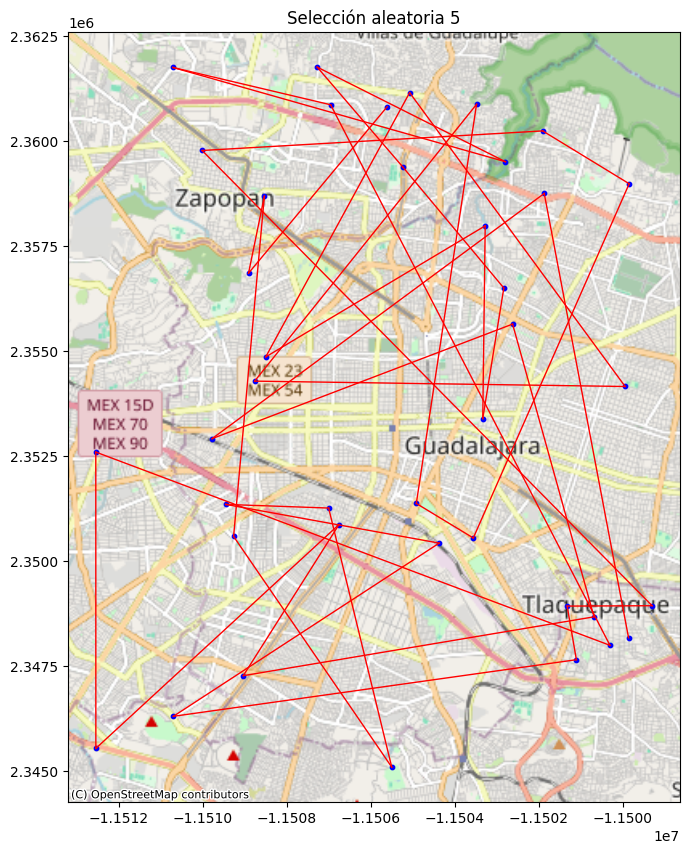

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_6.csv


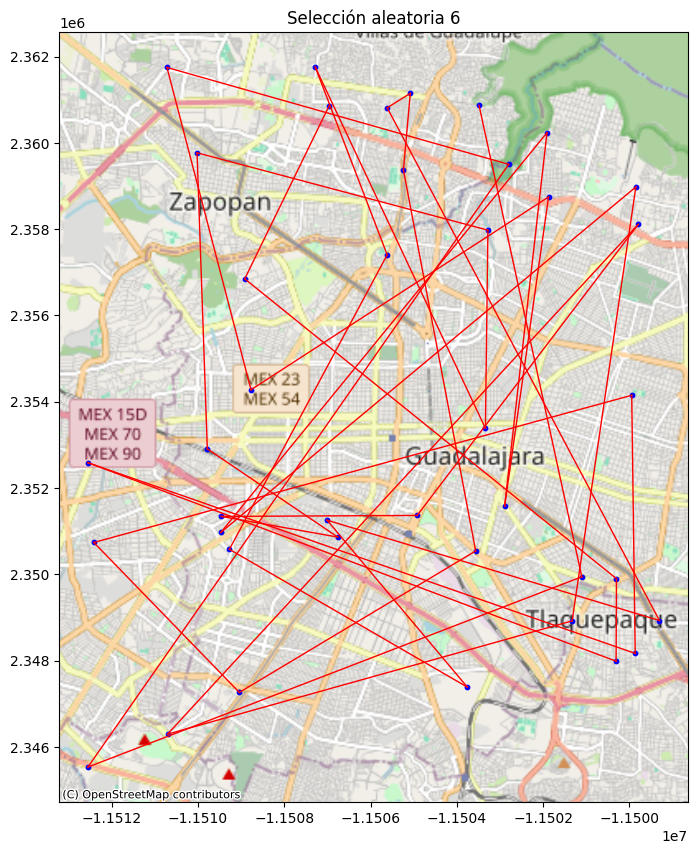

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_7.csv


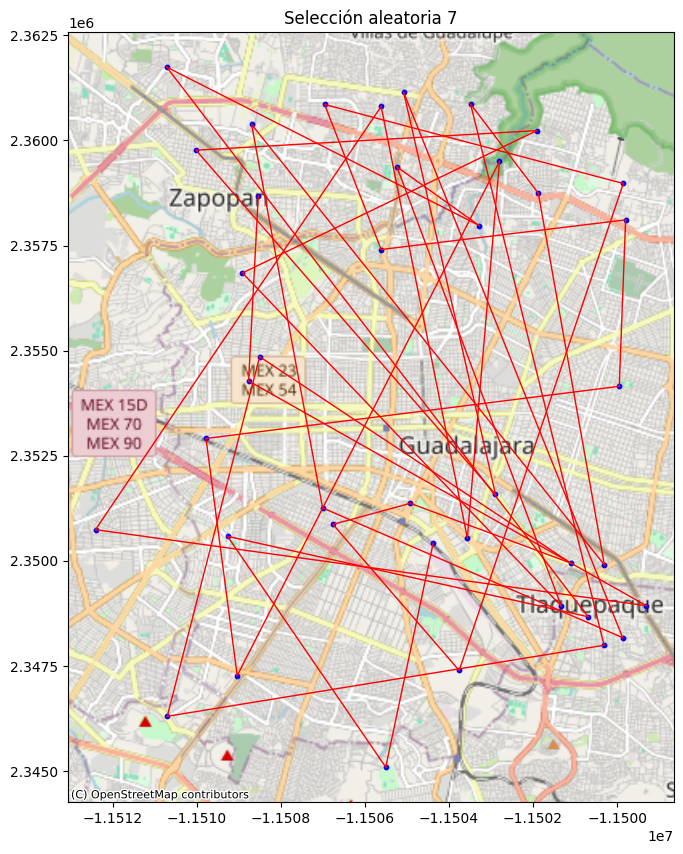

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_8.csv


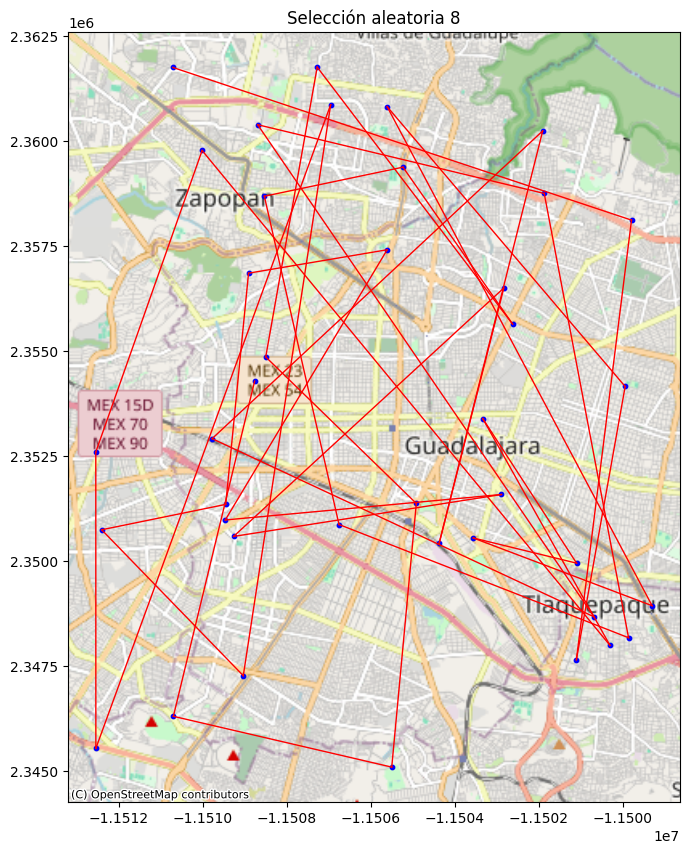

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_9.csv


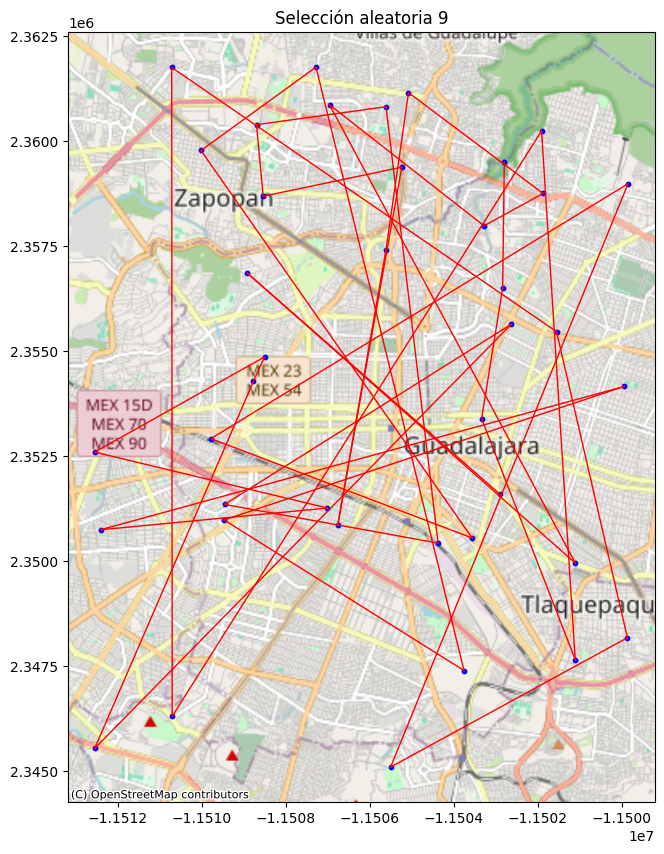

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_10.csv


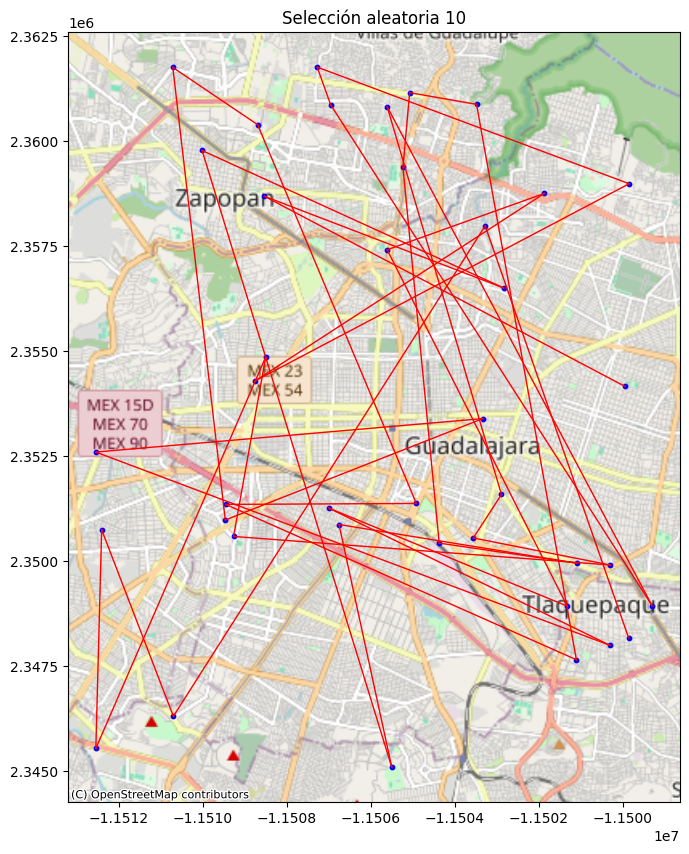

In [ ]:
import pandas as pd
import numpy as np
import random
from scipy.spatial import distance_matrix as dist_matrix_func  # Alias para evitar conflicto
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as ctx

# Paso 1: Cargar el archivo CSV
csv_file = '/content/gdrive/MyDrive/DireccionesSP/TSP_SP_REAL.csv'
df = pd.read_csv(csv_file)

# Paso 2: Limpiar las coordenadas
df[['latitud', 'longitud']] = df['Coordenadas'].str.split(',', expand=True)
df['latitud'] = pd.to_numeric(df['latitud'])
df['longitud'] = pd.to_numeric(df['longitud'])


df_con_coordenadas = df

# Paso 4: Crear 10 selecciones aleatorias de 40 puntos de los primeros 50
selecciones_aleatorias = []
for i in range(10):
    seleccion = df_con_coordenadas.sample(n=40, random_state=random.randint(0, 1000))
    selecciones_aleatorias.append(seleccion)

# Función para calcular la matriz de distancias usando scipy.spatial.distance_matrix
def calcular_matriz_distancias(seleccion):
    coords = seleccion[['latitud', 'longitud']].values
    return dist_matrix_func(coords, coords)

# Guardar cada matriz de distancias en un archivo CSV
for idx, seleccion in enumerate(selecciones_aleatorias):
    dist_matrix = calcular_matriz_distancias(seleccion)
    dist_df = pd.DataFrame(dist_matrix)  # Convertir la matriz a DataFrame de pandas
    output_file = f'/content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion_{idx + 1}.csv'
    dist_df.to_csv(output_file, index=False)  # Guardar el archivo CSV
    print(f"Archivo guardado: {output_file}")

    # Crear geometría de puntos a partir de latitud y longitud
    seleccion['geometry'] = seleccion.apply(lambda row: Point(float(row['longitud']), float(row['latitud'])), axis=1)

    # Convertir a GeoDataFrame
    gdf = gpd.GeoDataFrame(seleccion, geometry='geometry', crs="EPSG:4326")

    # Convertir las coordenadas a la proyección adecuada para contextily
    gdf = gdf.to_crs(epsg=3857)

    # Graficar con mapa real de fondo
    fig, ax = plt.subplots(figsize=(10, 10))

    # Graficar los puntos
    gdf.plot(ax=ax, color='blue', markersize=10)

    # Crear líneas entre los puntos
    for i in range(len(gdf) - 1):
        x_vals = [gdf.iloc[i].geometry.x, gdf.iloc[i + 1].geometry.x]
        y_vals = [gdf.iloc[i].geometry.y, gdf.iloc[i + 1].geometry.y]
        ax.plot(x_vals, y_vals, color='red', linestyle='-', linewidth=1)

    # Añadir el mapa de fondo con contextily
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=12)

    # Mostrar el mapa
    plt.title(f'Selección aleatoria {idx + 1}')
    plt.show()


# Algoritmos Utilizados

## 40 Nodos - Datos reales y comparacion con GAMS

### Genetico

In [ ]:
import numpy as np
import random
import time  # Importar el módulo time

def create_route(num_nodes):
    route = list(range(num_nodes))
    random.shuffle(route)
    return route

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def mutate(route):
    idx1, idx2 = random.sample(range(len(route)), 2)
    route[idx1], route[idx2] = route[idx2], route[idx1]

def crossover(parent1, parent2):
    idx1, idx2 = sorted(random.sample(range(len(parent1)), 2))
    child = [None] * len(parent1)
    child[idx1:idx2] = parent1[idx1:idx2]
    current_position = idx2
    for gene in parent2:
        if gene not in child:
            if current_position >= len(child):
                current_position = 0
            child[current_position] = gene
            current_position += 1
    return child

def genetic_algorithm(distance_matrix):
    num_nodes = len(distance_matrix)
    population_size = 100
    generations = 500
    mutation_rate = 0.02

    population = [create_route(num_nodes) for _ in range(population_size)]
    best_route = min(population, key=lambda route: route_distance(route, distance_matrix))
    best_distance = route_distance(best_route, distance_matrix)

    for generation in range(generations):
        population = sorted(population, key=lambda route: route_distance(route, distance_matrix))
        new_population = population[:2]  # Keep the best 2 routes
        while len(new_population) < population_size:
            parent1, parent2 = random.choices(population[:50], k=2)  # Select parents from the top 50 routes
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                mutate(child)
            new_population.append(child)

        population = new_population
        current_best = min(population, key=lambda route: route_distance(route, distance_matrix))
        current_best_distance = route_distance(current_best, distance_matrix)
        if current_best_distance < best_distance:
            best_route = current_best
            best_distance = current_best_distance

    return best_route, best_distance

# Ejecutar el algoritmo genético para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = genetic_algorithm(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [36, 28, 33, 9, 13, 18, 22, 20, 8, 4, 6, 2, 32, 27, 17, 0, 10, 19, 26, 29, 39, 1, 34, 14, 16, 25, 23, 24, 31, 35, 38, 5, 3, 15, 7, 12, 21, 37, 11, 30]
Best distance for selection 1: 0.8537464091540208
Time taken for selection 1: 4.55 seconds
Best route for selection 2: [15, 33, 29, 4, 9, 34, 36, 30, 8, 19, 35, 1, 5, 26, 10, 14, 21, 25, 22, 13, 27, 16, 28, 37, 0, 7, 20, 17, 3, 6, 2, 18, 23, 32, 39, 12, 31, 11, 24, 38]
Best distance for selection 2: 0.9172403660123425
Time taken for selection 2: 5.10 seconds
Best route for selection 3: [16, 27, 23, 35, 22, 32, 36, 33, 19, 14, 13, 28, 7, 18, 2, 15, 10, 24, 6, 17, 1, 25, 3, 30, 20, 38, 26, 11, 39, 5, 31, 34, 29, 12, 9, 37, 21, 8, 4, 0]
Best distance for selection 3: 0.8342417120835709
Time taken for selection 3: 2.82 seconds
Best route for selection 4: [22, 7, 15, 8, 10, 31, 25, 2, 29, 6, 32, 0, 5, 34, 23, 26, 38, 11, 30, 35, 24, 4, 20, 27, 18, 12, 13, 16, 14, 3, 17, 39, 37, 36, 33, 19, 28, 9, 21, 1]
Best distan

### Hormigas

In [ ]:
import random
import numpy as np
import time  # Importar el módulo time

# Supongamos que este es el diccionario con las matrices de distancias
# Cada entrada en el diccionario es una matriz de distancias para una selección aleatoria
distance_matrices = {}

# Calcular matrices de distancias para cada selección aleatoria
for idx, seleccion in enumerate(selecciones_aleatorias):
    # Calcular la matriz de distancias
    distance_matrix = compute_distance_matrix(seleccion)
    distance_matrices[idx] = distance_matrix

# Parámetros del algoritmo
num_ants = 10
num_iterations = 100
alpha = 1  # Controla la influencia de la feromona
beta = 2   # Controla la influencia de la heurística (distancia inversa)
rho = 0.5  # Tasa de evaporación de la feromona
q = 100    # Factor de refuerzo

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def ant_colony_optimization(distance_matrix):
    global pheromones  # Aseguramos que se acceda a la variable global

    num_nodes = len(distance_matrix)
    pheromones = np.ones((num_nodes, num_nodes))  # Inicialización de feromonas

    best_route = None
    best_distance = float('inf')

    for _ in range(num_iterations):
        all_routes = []
        all_distances = []

        for _ in range(num_ants):
            route = [random.choice(range(num_nodes))]
            while len(route) < num_nodes:
                current_node = route[-1]
                probabilities = []
                for next_node in range(num_nodes):
                    if next_node not in route:
                        pheromone = pheromones[current_node, next_node]
                        heuristic = 1 / distance_matrix[current_node, next_node]
                        prob = (pheromone ** alpha) * (heuristic ** beta)
                        probabilities.append(prob)
                    else:
                        probabilities.append(0)
                total_prob = sum(probabilities)
                if total_prob == 0:
                    probabilities = [1 / len(probabilities)] * len(probabilities)  # Si no hay probabilidades, repartir uniformemente
                else:
                    probabilities = [p / total_prob for p in probabilities]
                next_node = np.random.choice(range(num_nodes), p=probabilities)
                route.append(next_node)

            all_routes.append(route)
            distance = route_distance(route, distance_matrix)
            all_distances.append(distance)
            if distance < best_distance:
                best_route = route
                best_distance = distance

        # Actualizar feromonas
        pheromones *= (1 - rho)
        for i, route in enumerate(all_routes):
            for j in range(len(route)):
                pheromones[route[j], route[(j + 1) % len(route)]] += q / all_distances[i]

    return best_route, best_distance

# Ejecutar el algoritmo de colonia de hormigas para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = ant_colony_optimization(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [8, 6, 23, 18, 2, 36, 13, 3, 10, 31, 34, 21, 32, 26, 27, 29, 39, 4, 25, 20, 16, 17, 15, 24, 22, 5, 1, 38, 19, 0, 33, 9, 35, 14, 11, 7, 37, 30, 12, 28]
Best distance for selection 1: 0.7375798438668808
Time taken for selection 1: 5.37 seconds
Best route for selection 2: [22, 1, 13, 33, 16, 26, 39, 2, 36, 35, 27, 18, 7, 32, 6, 10, 17, 20, 9, 15, 34, 4, 3, 14, 30, 38, 5, 12, 21, 28, 29, 25, 31, 19, 23, 11, 37, 8, 24, 0]
Best distance for selection 2: 0.7677366052879818
Time taken for selection 2: 6.99 seconds
Best route for selection 3: [8, 14, 18, 4, 17, 23, 2, 21, 10, 11, 6, 36, 1, 27, 12, 30, 0, 24, 19, 16, 39, 34, 15, 38, 32, 9, 20, 26, 31, 3, 13, 28, 7, 25, 37, 29, 5, 22, 35, 33]
Best distance for selection 3: 0.7542215481978418
Time taken for selection 3: 7.27 seconds
Best route for selection 4: [12, 1, 13, 20, 38, 19, 33, 5, 36, 34, 15, 23, 9, 31, 18, 21, 14, 25, 3, 28, 32, 11, 22, 2, 37, 29, 10, 6, 35, 7, 0, 17, 30, 39, 8, 24, 26, 16, 4, 27]
Best distan

### Gams


Caso 1
Tiempo - 0.062s
Costo - 0.572
Caso 2
Tiempo - 0.062s
Costo - 0.559
Caso 3
Tiempo - 0.063s
Costo - 0.552
Caso 4
Tiempo - 0.063s
Costo - 0.523
Caso 5
Tiempo - 0.063s
Costo -  0.554
Caso 6
Tiempo - 0.063s
Costo - 0.559
Caso 7
Tiempo - 0.078s
Costo - 0.554
Caso 8
Tiempo - 0.063s
Costo - 0.581
Caso 9
Tiempo - 0.079s
Costo - 0.538
Caso 10
Tiempo - 0.062s
Costo - 0.557

## 100 Nodos - Generado

### Creacion de distancias

In [ ]:

# Paso 1: Cargar el archivo CSV
csv_file = '/content/gdrive/MyDrive/DireccionesSP/TSP_SP_REAL.csv'
df = pd.read_csv(csv_file)

# Paso 2: Limpiar las coordenadas
df[['latitud', 'longitud']] = df['Coordenadas'].str.split(',', expand=True)
df['latitud'] = pd.to_numeric(df['latitud'])
df['longitud'] = pd.to_numeric(df['longitud'])

# Paso 3: Filtrar solo las primeras 50 filas con coordenadas no nulas
df_con_coordenadas = df

# Paso 4: Crear 10 selecciones aleatorias de 100
selecciones_aleatorias = []
for i in range(10):
    seleccion = df_con_coordenadas.sample(n=100, random_state=random.randint(0, 1000))
    selecciones_aleatorias.append(seleccion)

# Función para calcular la matriz de distancias usando scipy.spatial.distance_matrix
def calcular_matriz_distancias(seleccion):
    coords = seleccion[['latitud', 'longitud']].values
    return dist_matrix_func(coords, coords)

# Guardar cada matriz de distancias en un archivo CSV
for idx, seleccion in enumerate(selecciones_aleatorias):
    dist_matrix = calcular_matriz_distancias(seleccion)
    dist_df = pd.DataFrame(dist_matrix)  # Convertir la matriz a DataFrame de pandas
    output_file = f'/content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_{idx + 1}.csv'
    dist_df.to_csv(output_file, index=False)  # Guardar el archivo CSV
    print(f"Archivo guardado: {output_file}")

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_1.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_2.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_3.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_4.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_5.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_6.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_7.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_8.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_9.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion100_10.csv


### Genetico

In [ ]:
import numpy as np
import random
import time  # Importar el módulo time

def create_route(num_nodes):
    route = list(range(num_nodes))
    random.shuffle(route)
    return route

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def mutate(route):
    idx1, idx2 = random.sample(range(len(route)), 2)
    route[idx1], route[idx2] = route[idx2], route[idx1]

def crossover(parent1, parent2):
    idx1, idx2 = sorted(random.sample(range(len(parent1)), 2))
    child = [None] * len(parent1)
    child[idx1:idx2] = parent1[idx1:idx2]
    current_position = idx2
    for gene in parent2:
        if gene not in child:
            if current_position >= len(child):
                current_position = 0
            child[current_position] = gene
            current_position += 1
    return child

def genetic_algorithm(distance_matrix):
    num_nodes = len(distance_matrix)
    population_size = 100
    generations = 500
    mutation_rate = 0.02

    population = [create_route(num_nodes) for _ in range(population_size)]
    best_route = min(population, key=lambda route: route_distance(route, distance_matrix))
    best_distance = route_distance(best_route, distance_matrix)

    for generation in range(generations):
        population = sorted(population, key=lambda route: route_distance(route, distance_matrix))
        new_population = population[:2]  # Keep the best 2 routes
        while len(new_population) < population_size:
            parent1, parent2 = random.choices(population[:50], k=2)  # Select parents from the top 50 routes
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                mutate(child)
            new_population.append(child)

        population = new_population
        current_best = min(population, key=lambda route: route_distance(route, distance_matrix))
        current_best_distance = route_distance(current_best, distance_matrix)
        if current_best_distance < best_distance:
            best_route = current_best
            best_distance = current_best_distance

    return best_route, best_distance

# Ejecutar el algoritmo genético para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = genetic_algorithm(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [26, 53, 89, 12, 27, 24, 46, 57, 96, 97, 76, 59, 13, 82, 99, 35, 43, 66, 84, 17, 1, 78, 37, 7, 65, 58, 90, 70, 6, 18, 10, 3, 52, 0, 36, 44, 5, 39, 41, 71, 48, 74, 67, 55, 47, 9, 40, 34, 80, 73, 29, 72, 98, 85, 28, 4, 2, 15, 31, 56, 88, 23, 86, 38, 75, 50, 45, 91, 81, 63, 21, 64, 69, 77, 49, 14, 87, 93, 32, 94, 20, 33, 19, 30, 11, 79, 54, 83, 16, 92, 51, 68, 42, 22, 60, 95, 25, 8, 62, 61]
Best distance for selection 1: 2.3594977391877308
Time taken for selection 1: 9.65 seconds
Best route for selection 2: [54, 30, 74, 71, 95, 88, 44, 99, 2, 3, 72, 94, 86, 82, 22, 32, 90, 63, 46, 91, 17, 53, 25, 50, 42, 93, 92, 57, 26, 58, 79, 0, 51, 6, 80, 8, 29, 40, 33, 62, 23, 78, 64, 5, 89, 20, 45, 7, 77, 61, 97, 15, 11, 41, 70, 19, 1, 39, 14, 56, 76, 10, 48, 85, 69, 24, 75, 36, 37, 34, 98, 35, 12, 31, 13, 65, 52, 21, 49, 9, 87, 66, 73, 47, 83, 81, 38, 68, 4, 60, 84, 55, 67, 59, 18, 16, 27, 43, 96, 28]
Best distance for selection 2: 2.6541302636651425
Time taken for select

### Hormigas

In [ ]:
import random
import numpy as np
import time  # Importar el módulo time

# Supongamos que este es el diccionario con las matrices de distancias
# Cada entrada en el diccionario es una matriz de distancias para una selección aleatoria
distance_matrices = {}

# Calcular matrices de distancias para cada selección aleatoria
for idx, seleccion in enumerate(selecciones_aleatorias):
    # Calcular la matriz de distancias
    distance_matrix = compute_distance_matrix(seleccion)
    distance_matrices[idx] = distance_matrix

# Parámetros del algoritmo
num_ants = 10
num_iterations = 100
alpha = 1  # Controla la influencia de la feromona
beta = 2   # Controla la influencia de la heurística (distancia inversa)
rho = 0.5  # Tasa de evaporación de la feromona
q = 100    # Factor de refuerzo

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def ant_colony_optimization(distance_matrix):
    global pheromones  # Aseguramos que se acceda a la variable global

    num_nodes = len(distance_matrix)
    pheromones = np.ones((num_nodes, num_nodes))  # Inicialización de feromonas

    best_route = None
    best_distance = float('inf')

    for _ in range(num_iterations):
        all_routes = []
        all_distances = []

        for _ in range(num_ants):
            route = [random.choice(range(num_nodes))]
            while len(route) < num_nodes:
                current_node = route[-1]
                probabilities = []
                for next_node in range(num_nodes):
                    if next_node not in route:
                        pheromone = pheromones[current_node, next_node]
                        heuristic = 1 / distance_matrix[current_node, next_node]
                        prob = (pheromone ** alpha) * (heuristic ** beta)
                        probabilities.append(prob)
                    else:
                        probabilities.append(0)
                total_prob = sum(probabilities)
                if total_prob == 0:
                    probabilities = [1 / len(probabilities)] * len(probabilities)  # Si no hay probabilidades, repartir uniformemente
                else:
                    probabilities = [p / total_prob for p in probabilities]
                next_node = np.random.choice(range(num_nodes), p=probabilities)
                route.append(next_node)

            all_routes.append(route)
            distance = route_distance(route, distance_matrix)
            all_distances.append(distance)
            if distance < best_distance:
                best_route = route
                best_distance = distance

        # Actualizar feromonas
        pheromones *= (1 - rho)
        for i, route in enumerate(all_routes):
            for j in range(len(route)):
                pheromones[route[j], route[(j + 1) % len(route)]] += q / all_distances[i]

    return best_route, best_distance

# Ejecutar el algoritmo de colonia de hormigas para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = ant_colony_optimization(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [22, 79, 85, 86, 72, 83, 98, 17, 33, 3, 64, 16, 47, 60, 80, 10, 58, 53, 88, 42, 44, 49, 74, 11, 75, 18, 30, 94, 13, 12, 37, 73, 84, 92, 28, 34, 36, 29, 57, 9, 54, 97, 51, 99, 41, 81, 48, 15, 62, 25, 76, 96, 0, 4, 63, 45, 19, 46, 6, 56, 70, 71, 93, 82, 32, 52, 78, 7, 2, 59, 1, 27, 68, 67, 38, 21, 89, 90, 5, 43, 8, 87, 14, 24, 39, 20, 23, 26, 69, 55, 65, 77, 91, 61, 50, 95, 35, 31, 40, 66]
Best distance for selection 1: 1.2401557127863505
Time taken for selection 1: 34.45 seconds
Best route for selection 2: [40, 29, 95, 52, 64, 62, 97, 11, 53, 78, 36, 41, 85, 2, 86, 51, 49, 92, 28, 71, 46, 6, 77, 84, 93, 89, 18, 60, 8, 80, 7, 27, 30, 12, 5, 81, 20, 69, 16, 23, 90, 4, 76, 42, 3, 15, 9, 17, 96, 47, 99, 79, 67, 66, 1, 39, 50, 13, 34, 38, 70, 58, 91, 26, 35, 65, 63, 56, 48, 21, 74, 32, 25, 0, 68, 54, 88, 55, 82, 75, 14, 19, 10, 37, 31, 59, 98, 45, 94, 83, 43, 24, 73, 57, 22, 72, 44, 87, 33, 61]
Best distance for selection 2: 1.1600935123451177
Time taken for selec

## 150 Nodos - Generado

### Generacion distancias

In [ ]:

# Paso 1: Cargar el archivo CSV
csv_file = '/content/gdrive/MyDrive/DireccionesSP/TSP_SP_REAL.csv'
df = pd.read_csv(csv_file)

# Paso 2: Limpiar las coordenadas
df[['latitud', 'longitud']] = df['Coordenadas'].str.split(',', expand=True)
df['latitud'] = pd.to_numeric(df['latitud'])
df['longitud'] = pd.to_numeric(df['longitud'])

df_con_coordenadas = df

# Paso 4: Crear 150 selecciones aleatorias
selecciones_aleatorias = []
for i in range(10):
    seleccion = df_con_coordenadas.sample(n=150, random_state=random.randint(0, 1000))
    selecciones_aleatorias.append(seleccion)

# Función para calcular la matriz de distancias usando scipy.spatial.distance_matrix
def calcular_matriz_distancias(seleccion):
    coords = seleccion[['latitud', 'longitud']].values
    return dist_matrix_func(coords, coords)

# Guardar cada matriz de distancias en un archivo CSV
for idx, seleccion in enumerate(selecciones_aleatorias):
    dist_matrix = calcular_matriz_distancias(seleccion)
    dist_df = pd.DataFrame(dist_matrix)  # Convertir la matriz a DataFrame de pandas
    output_file = f'/content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_{idx + 1}.csv'
    dist_df.to_csv(output_file, index=False)  # Guardar el archivo CSV
    print(f"Archivo guardado: {output_file}")

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_1.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_2.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_3.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_4.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_5.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_6.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_7.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_8.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_9.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion150_10.csv


### Genetico

In [ ]:
import numpy as np
import random
import time  # Importar el módulo time

def create_route(num_nodes):
    route = list(range(num_nodes))
    random.shuffle(route)
    return route

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def mutate(route):
    idx1, idx2 = random.sample(range(len(route)), 2)
    route[idx1], route[idx2] = route[idx2], route[idx1]

def crossover(parent1, parent2):
    idx1, idx2 = sorted(random.sample(range(len(parent1)), 2))
    child = [None] * len(parent1)
    child[idx1:idx2] = parent1[idx1:idx2]
    current_position = idx2
    for gene in parent2:
        if gene not in child:
            if current_position >= len(child):
                current_position = 0
            child[current_position] = gene
            current_position += 1
    return child

def genetic_algorithm(distance_matrix):
    num_nodes = len(distance_matrix)
    population_size = 100
    generations = 500
    mutation_rate = 0.02

    population = [create_route(num_nodes) for _ in range(population_size)]
    best_route = min(population, key=lambda route: route_distance(route, distance_matrix))
    best_distance = route_distance(best_route, distance_matrix)

    for generation in range(generations):
        population = sorted(population, key=lambda route: route_distance(route, distance_matrix))
        new_population = population[:2]  # Keep the best 2 routes
        while len(new_population) < population_size:
            parent1, parent2 = random.choices(population[:50], k=2)  # Select parents from the top 50 routes
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                mutate(child)
            new_population.append(child)

        population = new_population
        current_best = min(population, key=lambda route: route_distance(route, distance_matrix))
        current_best_distance = route_distance(current_best, distance_matrix)
        if current_best_distance < best_distance:
            best_route = current_best
            best_distance = current_best_distance

    return best_route, best_distance

# Ejecutar el algoritmo genético para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = genetic_algorithm(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [42, 44, 88, 28, 47, 53, 12, 75, 23, 8, 93, 71, 38, 59, 55, 78, 1, 27, 21, 90, 5, 87, 39, 24, 26, 6, 46, 19, 70, 82, 56, 54, 25, 76, 62, 31, 40, 15, 35, 79, 86, 81, 9, 57, 34, 72, 85, 95, 61, 50, 77, 92, 11, 7, 94, 32, 73, 10, 80, 17, 16, 64, 41, 99, 66, 48, 63, 0, 96, 4, 20, 43, 45, 14, 89, 67, 69, 68, 18, 74, 65, 37, 2, 13, 52, 30, 29, 97, 51, 36, 98, 22, 33, 83, 91, 3, 60, 58, 84, 49]
Best distance for selection 1: 2.6264030798120017
Time taken for selection 1: 11.19 seconds
Best route for selection 2: [76, 20, 90, 43, 16, 3, 42, 47, 73, 81, 44, 82, 29, 62, 85, 11, 86, 51, 97, 53, 2, 98, 31, 94, 59, 75, 22, 37, 70, 35, 34, 50, 27, 72, 48, 74, 21, 89, 32, 55, 68, 88, 87, 93, 18, 80, 38, 91, 1, 39, 30, 57, 24, 4, 23, 69, 15, 5, 12, 96, 9, 99, 67, 58, 26, 63, 65, 13, 66, 17, 79, 60, 84, 77, 28, 46, 6, 71, 92, 49, 78, 40, 52, 41, 36, 64, 61, 33, 95, 19, 14, 54, 7, 8, 56, 0, 25, 10, 45, 83]
Best distance for selection 2: 2.534830986185513
Time taken for select

### Hormigas

In [ ]:
import random
import numpy as np
import time  # Importar el módulo time

# Supongamos que este es el diccionario con las matrices de distancias
# Cada entrada en el diccionario es una matriz de distancias para una selección aleatoria
distance_matrices = {}

# Calcular matrices de distancias para cada selección aleatoria
for idx, seleccion in enumerate(selecciones_aleatorias):
    # Calcular la matriz de distancias
    distance_matrix = compute_distance_matrix(seleccion)
    distance_matrices[idx] = distance_matrix

# Parámetros del algoritmo
num_ants = 10
num_iterations = 100
alpha = 1  # Controla la influencia de la feromona
beta = 2   # Controla la influencia de la heurística (distancia inversa)
rho = 0.5  # Tasa de evaporación de la feromona
q = 100    # Factor de refuerzo

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def ant_colony_optimization(distance_matrix):
    global pheromones  # Aseguramos que se acceda a la variable global

    num_nodes = len(distance_matrix)
    pheromones = np.ones((num_nodes, num_nodes))  # Inicialización de feromonas

    best_route = None
    best_distance = float('inf')

    for _ in range(num_iterations):
        all_routes = []
        all_distances = []

        for _ in range(num_ants):
            route = [random.choice(range(num_nodes))]
            while len(route) < num_nodes:
                current_node = route[-1]
                probabilities = []
                for next_node in range(num_nodes):
                    if next_node not in route:
                        pheromone = pheromones[current_node, next_node]
                        heuristic = 1 / distance_matrix[current_node, next_node]
                        prob = (pheromone ** alpha) * (heuristic ** beta)
                        probabilities.append(prob)
                    else:
                        probabilities.append(0)
                total_prob = sum(probabilities)
                if total_prob == 0:
                    probabilities = [1 / len(probabilities)] * len(probabilities)  # Si no hay probabilidades, repartir uniformemente
                else:
                    probabilities = [p / total_prob for p in probabilities]
                next_node = np.random.choice(range(num_nodes), p=probabilities)
                route.append(next_node)

            all_routes.append(route)
            distance = route_distance(route, distance_matrix)
            all_distances.append(distance)
            if distance < best_distance:
                best_route = route
                best_distance = distance

        # Actualizar feromonas
        pheromones *= (1 - rho)
        for i, route in enumerate(all_routes):
            for j in range(len(route)):
                pheromones[route[j], route[(j + 1) % len(route)]] += q / all_distances[i]

    return best_route, best_distance

# Ejecutar el algoritmo de colonia de hormigas para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = ant_colony_optimization(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [148, 44, 0, 113, 58, 69, 136, 100, 8, 116, 74, 107, 105, 46, 114, 6, 118, 115, 40, 145, 31, 28, 47, 39, 143, 90, 85, 124, 2, 84, 35, 9, 38, 83, 13, 82, 37, 15, 75, 81, 4, 93, 110, 63, 119, 36, 78, 45, 68, 41, 11, 59, 128, 146, 42, 120, 134, 62, 79, 76, 27, 22, 101, 20, 88, 95, 106, 23, 137, 96, 55, 144, 73, 109, 132, 129, 117, 130, 142, 24, 112, 3, 122, 104, 54, 50, 102, 139, 121, 123, 25, 29, 103, 98, 21, 147, 92, 48, 67, 70, 1, 19, 149, 16, 141, 133, 7, 52, 91, 12, 108, 61, 60, 34, 32, 33, 30, 127, 86, 57, 53, 66, 64, 126, 138, 18, 5, 80, 135, 77, 131, 71, 43, 49, 65, 125, 17, 111, 26, 72, 99, 14, 89, 51, 56, 140, 94, 87, 97, 10]
Best distance for selection 1: 1.5549522716296809
Time taken for selection 1: 86.57 seconds
Best route for selection 2: [134, 92, 145, 118, 21, 41, 133, 135, 73, 60, 15, 13, 87, 139, 40, 12, 42, 16, 53, 140, 93, 8, 2, 24, 107, 88, 23, 79, 67, 90, 83, 64, 74, 58, 100, 148, 20, 48, 129, 84, 6, 121, 71, 43, 75, 126, 7, 59, 114, 98, 

## 200 Nodos - Generado

### Generacion Distancias

In [ ]:

# Paso 1: Cargar el archivo CSV
csv_file = '/content/gdrive/MyDrive/DireccionesSP/TSP_SP_REAL.csv'
df = pd.read_csv(csv_file)

# Paso 2: Limpiar las coordenadas
df[['latitud', 'longitud']] = df['Coordenadas'].str.split(',', expand=True)
df['latitud'] = pd.to_numeric(df['latitud'])
df['longitud'] = pd.to_numeric(df['longitud'])

df_con_coordenadas = df

# Paso 4: Crear 200 selecciones aleatorias
selecciones_aleatorias = []
for i in range(10):
    seleccion = df_con_coordenadas.sample(n=200, random_state=random.randint(0, 1000))
    selecciones_aleatorias.append(seleccion)

# Función para calcular la matriz de distancias usando scipy.spatial.distance_matrix
def calcular_matriz_distancias(seleccion):
    coords = seleccion[['latitud', 'longitud']].values
    return dist_matrix_func(coords, coords)

# Guardar cada matriz de distancias en un archivo CSV
for idx, seleccion in enumerate(selecciones_aleatorias):
    dist_matrix = calcular_matriz_distancias(seleccion)
    dist_df = pd.DataFrame(dist_matrix)  # Convertir la matriz a DataFrame de pandas
    output_file = f'/content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_{idx + 1}.csv'
    dist_df.to_csv(output_file, index=False)  # Guardar el archivo CSV
    print(f"Archivo guardado: {output_file}")

Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_1.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_2.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_3.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_4.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_5.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_6.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_7.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_8.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_9.csv
Archivo guardado: /content/gdrive/MyDrive/DireccionesSP/dist_matrix_seleccion200_10.csv


### Genetico

In [ ]:
import numpy as np
import random
import time  # Importar el módulo time

def create_route(num_nodes):
    route = list(range(num_nodes))
    random.shuffle(route)
    return route

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def mutate(route):
    idx1, idx2 = random.sample(range(len(route)), 2)
    route[idx1], route[idx2] = route[idx2], route[idx1]

def crossover(parent1, parent2):
    idx1, idx2 = sorted(random.sample(range(len(parent1)), 2))
    child = [None] * len(parent1)
    child[idx1:idx2] = parent1[idx1:idx2]
    current_position = idx2
    for gene in parent2:
        if gene not in child:
            if current_position >= len(child):
                current_position = 0
            child[current_position] = gene
            current_position += 1
    return child

def genetic_algorithm(distance_matrix):
    num_nodes = len(distance_matrix)
    population_size = 100
    generations = 500
    mutation_rate = 0.02

    population = [create_route(num_nodes) for _ in range(population_size)]
    best_route = min(population, key=lambda route: route_distance(route, distance_matrix))
    best_distance = route_distance(best_route, distance_matrix)

    for generation in range(generations):
        population = sorted(population, key=lambda route: route_distance(route, distance_matrix))
        new_population = population[:2]  # Keep the best 2 routes
        while len(new_population) < population_size:
            parent1, parent2 = random.choices(population[:50], k=2)  # Select parents from the top 50 routes
            child = crossover(parent1, parent2)
            if random.random() < mutation_rate:
                mutate(child)
            new_population.append(child)

        population = new_population
        current_best = min(population, key=lambda route: route_distance(route, distance_matrix))
        current_best_distance = route_distance(current_best, distance_matrix)
        if current_best_distance < best_distance:
            best_route = current_best
            best_distance = current_best_distance

    return best_route, best_distance

# Ejecutar el algoritmo genético para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = genetic_algorithm(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [79, 131, 99, 72, 56, 51, 89, 132, 129, 101, 144, 11, 36, 15, 45, 78, 124, 128, 110, 40, 6, 96, 59, 81, 37, 118, 46, 148, 87, 136, 91, 121, 123, 139, 65, 25, 12, 67, 111, 66, 127, 138, 19, 33, 32, 70, 1, 61, 60, 48, 34, 29, 108, 17, 43, 135, 64, 14, 5, 130, 95, 88, 137, 55, 73, 41, 47, 68, 75, 84, 4, 63, 119, 83, 35, 31, 134, 3, 112, 141, 133, 16, 92, 97, 116, 114, 2, 115, 44, 8, 107, 74, 100, 0, 62, 122, 104, 49, 71, 18, 77, 147, 98, 21, 10, 94, 149, 52, 26, 53, 86, 30, 57, 126, 80, 22, 24, 142, 54, 120, 145, 103, 7, 102, 125, 50, 143, 90, 58, 69, 113, 105, 93, 38, 9, 13, 82, 42, 27, 85, 39, 28, 140, 146, 23, 106, 109, 76, 117, 20]
Best distance for selection 1: 4.038296383879789
Time taken for selection 1: 20.58 seconds
Best route for selection 2: [97, 73, 57, 31, 120, 131, 45, 141, 32, 137, 104, 61, 101, 149, 144, 146, 4, 113, 139, 87, 0, 9, 78, 21, 108, 7, 85, 59, 122, 112, 77, 102, 43, 28, 124, 56, 91, 86, 128, 12, 76, 105, 147, 10, 118, 22, 106, 44, 42

### Hormigas

In [ ]:
import random
import numpy as np
import time  # Importar el módulo time

# Supongamos que este es el diccionario con las matrices de distancias
# Cada entrada en el diccionario es una matriz de distancias para una selección aleatoria
distance_matrices = {}

# Calcular matrices de distancias para cada selección aleatoria
for idx, seleccion in enumerate(selecciones_aleatorias):
    # Calcular la matriz de distancias
    distance_matrix = compute_distance_matrix(seleccion)
    distance_matrices[idx] = distance_matrix

# Parámetros del algoritmo
num_ants = 10
num_iterations = 100
alpha = 1  # Controla la influencia de la feromona
beta = 2   # Controla la influencia de la heurística (distancia inversa)
rho = 0.5  # Tasa de evaporación de la feromona
q = 100    # Factor de refuerzo

def route_distance(route, distance_matrix):
    distance = 0
    for i in range(len(route)):
        distance += distance_matrix[route[i], route[(i + 1) % len(route)]]
    return distance

def ant_colony_optimization(distance_matrix):
    global pheromones  # Aseguramos que se acceda a la variable global

    num_nodes = len(distance_matrix)
    pheromones = np.ones((num_nodes, num_nodes))  # Inicialización de feromonas

    best_route = None
    best_distance = float('inf')

    for _ in range(num_iterations):
        all_routes = []
        all_distances = []

        for _ in range(num_ants):
            route = [random.choice(range(num_nodes))]
            while len(route) < num_nodes:
                current_node = route[-1]
                probabilities = []
                for next_node in range(num_nodes):
                    if next_node not in route:
                        pheromone = pheromones[current_node, next_node]
                        heuristic = 1 / distance_matrix[current_node, next_node]
                        prob = (pheromone ** alpha) * (heuristic ** beta)
                        probabilities.append(prob)
                    else:
                        probabilities.append(0)
                total_prob = sum(probabilities)
                if total_prob == 0:
                    probabilities = [1 / len(probabilities)] * len(probabilities)  # Si no hay probabilidades, repartir uniformemente
                else:
                    probabilities = [p / total_prob for p in probabilities]
                next_node = np.random.choice(range(num_nodes), p=probabilities)
                route.append(next_node)

            all_routes.append(route)
            distance = route_distance(route, distance_matrix)
            all_distances.append(distance)
            if distance < best_distance:
                best_route = route
                best_distance = distance

        # Actualizar feromonas
        pheromones *= (1 - rho)
        for i, route in enumerate(all_routes):
            for j in range(len(route)):
                pheromones[route[j], route[(j + 1) % len(route)]] += q / all_distances[i]

    return best_route, best_distance

# Ejecutar el algoritmo de colonia de hormigas para cada matriz de distancias
for idx, distance_matrix in distance_matrices.items():
    start_time = time.time()  # Registrar el tiempo de inicio
    best_route, best_distance = ant_colony_optimization(distance_matrix)
    end_time = time.time()  # Registrar el tiempo de finalización
    elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido

    print(f"Best route for selection {idx + 1}:", best_route)
    print(f"Best distance for selection {idx + 1}:", best_distance)
    print(f"Time taken for selection {idx + 1}: {elapsed_time:.2f} seconds")  # Mostrar el tiempo transcurrido


Best route for selection 1: [79, 178, 77, 155, 50, 31, 114, 131, 184, 91, 92, 145, 146, 165, 58, 88, 97, 39, 183, 62, 73, 13, 180, 83, 78, 164, 158, 47, 3, 133, 85, 134, 185, 143, 87, 132, 102, 61, 150, 126, 136, 89, 142, 159, 21, 9, 53, 12, 187, 37, 138, 120, 30, 94, 99, 154, 192, 104, 84, 5, 128, 0, 96, 117, 139, 108, 148, 149, 27, 194, 198, 66, 161, 144, 14, 137, 191, 157, 179, 189, 22, 60, 125, 177, 174, 16, 49, 168, 156, 42, 15, 48, 107, 75, 33, 166, 171, 8, 24, 127, 190, 175, 7, 45, 36, 93, 135, 124, 123, 11, 63, 160, 28, 64, 4, 40, 86, 69, 197, 98, 140, 44, 151, 52, 71, 26, 109, 112, 153, 57, 6, 141, 111, 113, 43, 74, 35, 81, 41, 23, 193, 46, 163, 76, 70, 100, 118, 59, 80, 19, 67, 18, 196, 82, 68, 186, 25, 38, 20, 169, 119, 34, 106, 103, 188, 172, 1, 181, 55, 122, 147, 32, 10, 72, 54, 176, 95, 152, 90, 162, 199, 105, 29, 101, 129, 121, 51, 56, 130, 17, 2, 173, 167, 115, 110, 116, 195, 170, 182, 65]
Best distance for selection 1: 1.7521424812125053
Time taken for selection 1: 184

## Comparaciones

In [ ]:
import matplotlib.pyplot as plt
csv_file40 = '/content/gdrive/MyDrive/DireccionesSP/Comparacion40n.csv'
data40 = pd.read_csv(csv_file40)

csv_file100 = '/content/gdrive/MyDrive/DireccionesSP/Comparacion100n.csv'
data100 = pd.read_csv(csv_file100)

csv_file150 = '/content/gdrive/MyDrive/DireccionesSP/Comparacion150n.csv'
data150 = pd.read_csv(csv_file150)

csv_file200 = '/content/gdrive/MyDrive/DireccionesSP/Comparacion200n.csv'
data200 = pd.read_csv(csv_file200)

# Definir los colores pastel
color_genetico = '#77dd77'  # Verde pastel
color_hormigas = '#ff6961'  # Rojo pastel

### 40 Nodos

In [ ]:
# Calcular los promedios
promedio_genetico_valor = data40['GeneticoF'].mean()
promedio_hormigas_valor = data40['HormigasF'].mean()
promedio_gams_valor = data40['GAMSF'].mean()

promedio_genetico_tiempo = data40['GeneticoT'].mean()
promedio_hormigas_tiempo = data40['HormigasT'].mean()
promedio_gams_tiempo = data40['GAMST'].mean()

# Calcular diferencias porcentuales
diferencia_genetico_hormigas_valor = (promedio_hormigas_valor - promedio_genetico_valor) / promedio_genetico_valor * 100
diferencia_hormigas_gams_valor = (promedio_hormigas_valor - promedio_gams_valor) / promedio_gams_valor * 100

diferencia_genetico_hormigas_tiempo = (promedio_hormigas_tiempo - promedio_genetico_tiempo) / promedio_genetico_tiempo * 100
diferencia_hormigas_gams_tiempo = (promedio_hormigas_tiempo - promedio_gams_tiempo) / promedio_gams_tiempo * 100


#### Tiempo ejecucion promedio, genetico vs hormigas vs gams

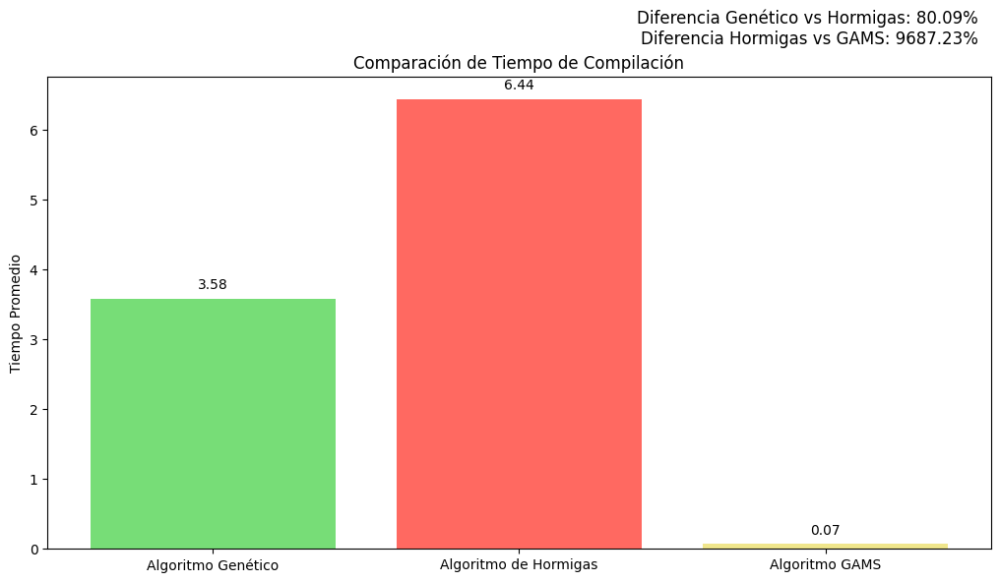

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_tiempo, diferencia_hormigas_gams_tiempo

# Graficar comparación de tiempos de compilación
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Tiempo de Compilación')
plt.ylabel('Tiempo Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_tiempo = max([promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo])
text_x = 2.5  # Posición horizontal
text_y = max_tiempo * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_tiempo:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_tiempo:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


#### Funcion objetivo promedio, genético vs hormigas vs gams

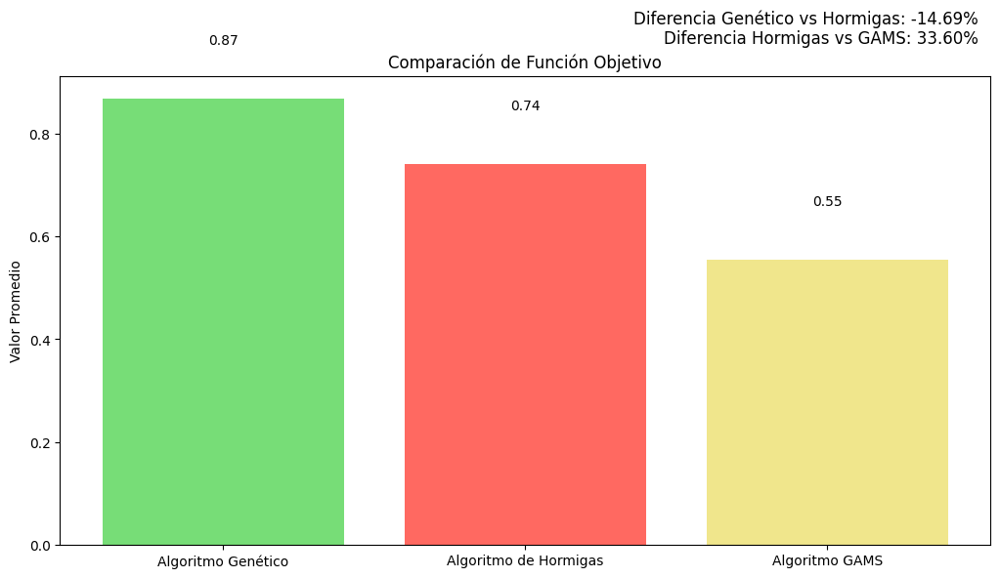

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_obj, promedio_hormigas_obj, promedio_gams_obj,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_obj, diferencia_hormigas_gams_obj

# Graficar comparación de la función objetivo
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Función Objetivo')
plt.ylabel('Valor Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_obj = max([promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor])
text_x = 2.5  # Posición horizontal
text_y = max_obj * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_valor:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_valor:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


### 100 Nodos

In [ ]:
# Calcular los promedios
promedio_genetico_valor = data100['GeneticoF'].mean()
promedio_hormigas_valor = data100['HormigasF'].mean()
promedio_gams_valor = data100['GAMSF'].mean()

promedio_genetico_tiempo = data100['GeneticoT'].mean()
promedio_hormigas_tiempo = data100['HormigasT'].mean()
promedio_gams_tiempo = data100['GAMST'].mean()

# Calcular diferencias porcentuales
diferencia_genetico_hormigas_valor = (promedio_hormigas_valor - promedio_genetico_valor) / promedio_genetico_valor * 100
diferencia_hormigas_gams_valor = (promedio_hormigas_valor - promedio_gams_valor) / promedio_gams_valor * 100

diferencia_genetico_hormigas_tiempo = (promedio_hormigas_tiempo - promedio_genetico_tiempo) / promedio_genetico_tiempo * 100
diferencia_hormigas_gams_tiempo = (promedio_hormigas_tiempo - promedio_gams_tiempo) / promedio_gams_tiempo * 100


#### Tiempo ejecucion promedio, genetico vs hormigas

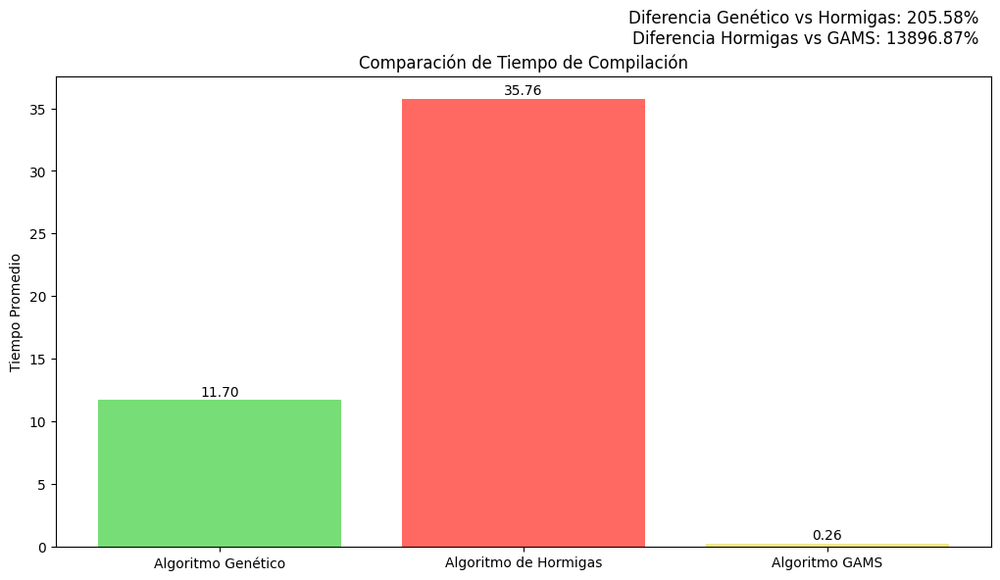

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_tiempo, diferencia_hormigas_gams_tiempo

# Graficar comparación de tiempos de compilación
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Tiempo de Compilación')
plt.ylabel('Tiempo Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_tiempo = max([promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo])
text_x = 2.5  # Posición horizontal
text_y = max_tiempo * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_tiempo:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_tiempo:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


#### Funcion objetivo promedio, genético vs hormigas

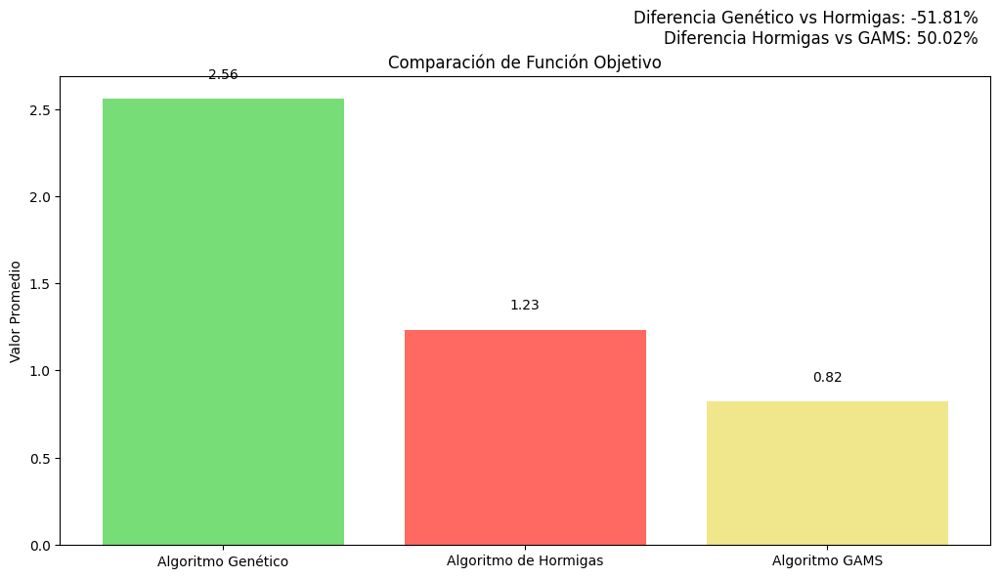

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_obj, promedio_hormigas_obj, promedio_gams_obj,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_obj, diferencia_hormigas_gams_obj

# Graficar comparación de la función objetivo
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Función Objetivo')
plt.ylabel('Valor Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_obj = max([promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor])
text_x = 2.5  # Posición horizontal
text_y = max_obj * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_valor:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_valor:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


### 150 Nodos

In [ ]:
# Calcular los promedios
promedio_genetico_valor = data150['GeneticoF'].mean()
promedio_hormigas_valor = data150['HormigasF'].mean()
promedio_gams_valor = data150['GAMSF'].mean()

promedio_genetico_tiempo = data150['GeneticoT'].mean()
promedio_hormigas_tiempo = data150['HormigasT'].mean()
promedio_gams_tiempo = data150['GAMST'].mean()

# Calcular diferencias porcentuales
diferencia_genetico_hormigas_valor = (promedio_hormigas_valor - promedio_genetico_valor) / promedio_genetico_valor * 100
diferencia_hormigas_gams_valor = (promedio_hormigas_valor - promedio_gams_valor) / promedio_gams_valor * 100

diferencia_genetico_hormigas_tiempo = (promedio_hormigas_tiempo - promedio_genetico_tiempo) / promedio_genetico_tiempo * 100
diferencia_hormigas_gams_tiempo = (promedio_hormigas_tiempo - promedio_gams_tiempo) / promedio_gams_tiempo * 100


#### Tiempo ejecucion promedio, genetico vs hormigas

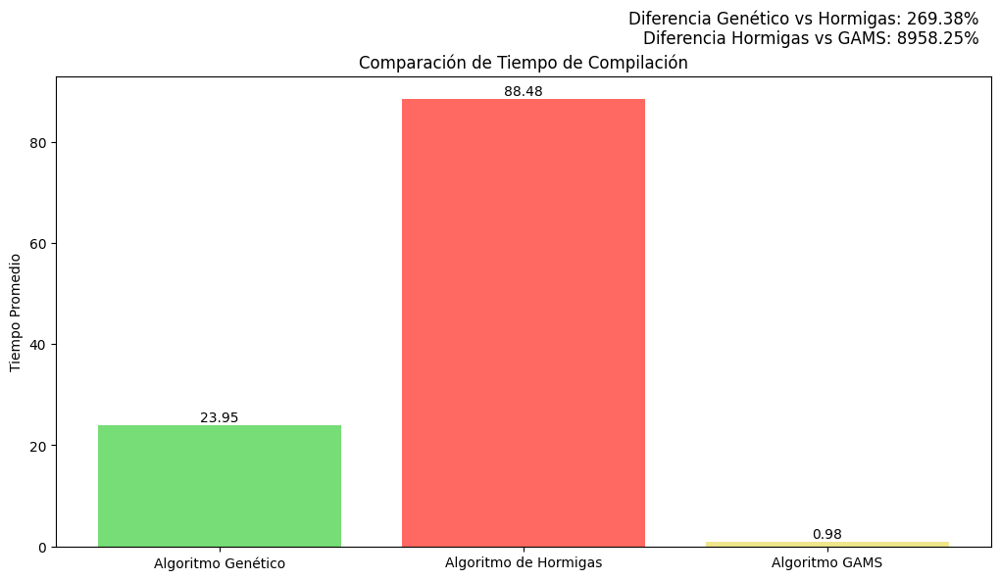

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_tiempo, diferencia_hormigas_gams_tiempo

# Graficar comparación de tiempos de compilación
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Tiempo de Compilación')
plt.ylabel('Tiempo Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_tiempo = max([promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo])
text_x = 2.5  # Posición horizontal
text_y = max_tiempo * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_tiempo:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_tiempo:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


#### Funcion objetivo promedio, genético vs hormigas

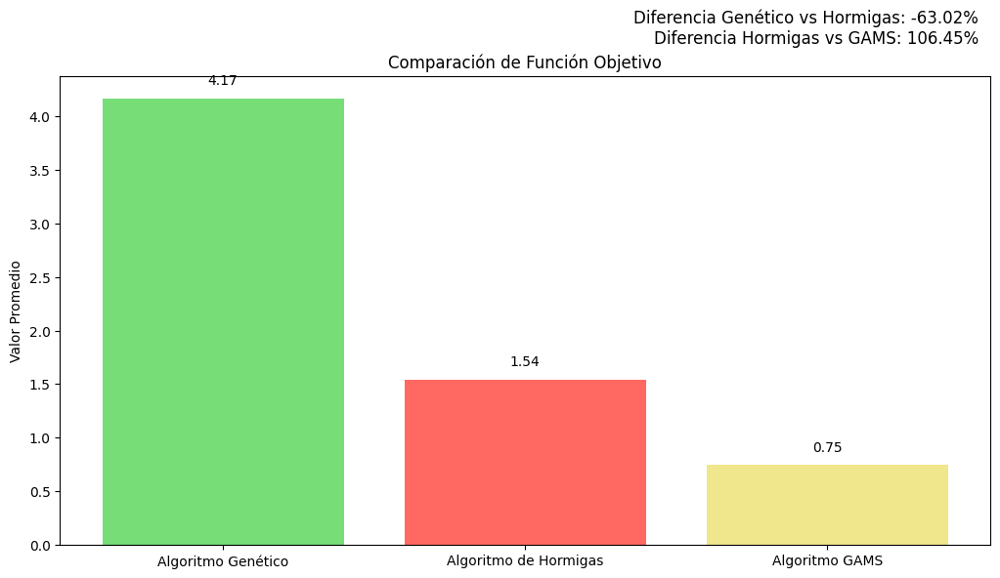

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_obj, promedio_hormigas_obj, promedio_gams_obj,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_obj, diferencia_hormigas_gams_obj

# Graficar comparación de la función objetivo
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Función Objetivo')
plt.ylabel('Valor Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_obj = max([promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor])
text_x = 2.5  # Posición horizontal
text_y = max_obj * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_valor:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_valor:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


### 200 Nodos

In [ ]:
# Calcular los promedios
promedio_genetico_valor = data200['GeneticoF'].mean()
promedio_hormigas_valor = data200['HormigasF'].mean()
promedio_gams_valor = data200['GAMSF'].mean()

promedio_genetico_tiempo = data200['GeneticoT'].mean()
promedio_hormigas_tiempo = data200['HormigasT'].mean()
promedio_gams_tiempo = data200['GAMST'].mean()

# Calcular diferencias porcentuales
diferencia_genetico_hormigas_valor = (promedio_hormigas_valor - promedio_genetico_valor) / promedio_genetico_valor * 100
diferencia_hormigas_gams_valor = (promedio_hormigas_valor - promedio_gams_valor) / promedio_gams_valor * 100

diferencia_genetico_hormigas_tiempo = (promedio_hormigas_tiempo - promedio_genetico_tiempo) / promedio_genetico_tiempo * 100
diferencia_hormigas_gams_tiempo = (promedio_hormigas_tiempo - promedio_gams_tiempo) / promedio_gams_tiempo * 100


#### Tiempo ejecucion promedio, genetico vs hormigas

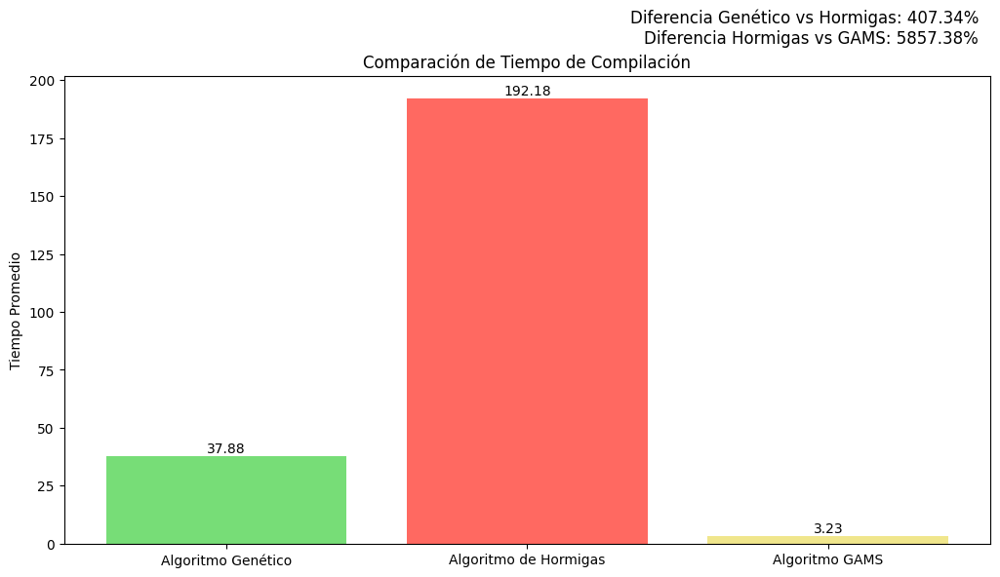

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_tiempo, diferencia_hormigas_gams_tiempo

# Graficar comparación de tiempos de compilación
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Tiempo de Compilación')
plt.ylabel('Tiempo Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_tiempo = max([promedio_genetico_tiempo, promedio_hormigas_tiempo, promedio_gams_tiempo])
text_x = 2.5  # Posición horizontal
text_y = max_tiempo * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_tiempo:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_tiempo:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


#### Funcion objetivo promedio, genético vs hormigas

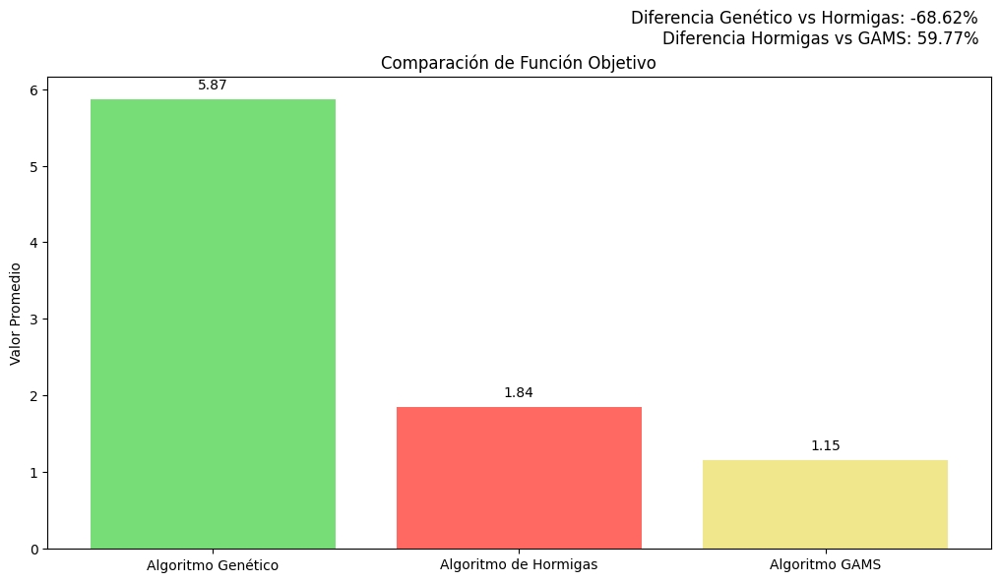

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes las variables promedio_genetico_obj, promedio_hormigas_obj, promedio_gams_obj,
# color_genetico, color_hormigas, diferencia_genetico_hormigas_obj, diferencia_hormigas_gams_obj

# Graficar comparación de la función objetivo
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 2)
bars = plt.bar(['Algoritmo Genético', 'Algoritmo de Hormigas', 'Algoritmo GAMS'],
               [promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor],
               color=[color_genetico, color_hormigas, '#f0e68c'])  # Añadido color amarillo pastel para GAMS
plt.title('Comparación de Función Objetivo')
plt.ylabel('Valor Promedio')

# Añadir los valores promedio encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}', ha='center', va='bottom')

# Calcular la posición para el texto
max_obj = max([promedio_genetico_valor, promedio_hormigas_valor, promedio_gams_valor])
text_x = 2.5  # Posición horizontal
text_y = max_obj * 1.2  # Posición vertical (más allá del valor máximo)

# Mostrar las diferencias porcentuales en la esquina superior derecha
plt.text(text_x, text_y,
         f'Diferencia Genético vs Hormigas: {diferencia_genetico_hormigas_valor:.2f}%\n'
         f'Diferencia Hormigas vs GAMS: {diferencia_hormigas_gams_valor:.2f}%',
         ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.tight_layout()
plt.show()


# Anexos

## Codigo GAMS

In [ ]:
# NO EJECUTAR
option optCr = 0, limRow = 0, limCol = 0, solPrint = off;

Set
    i 'nodos' /n1*n5/;
Alias(i,j);

Table d(i,j) 'Matriz de distancias'
           n1     n2     n3     n4     n5
    n1     90      1      1.4142 1      2.2361
    n2     1      90      2.2361 1.4142 2.8284
    n3     1.4142 2.2361 90      1      1.4142
    n4     1      1.4142 1      90      1.4142
    n5     2.2361 2.8284 1.4142 1.4142 90;

Parameter
    dist(i,j) 'Distancias entre nodos';

dist(i,j) = d(i,j);

Binary Variable
    x(i,j);

Variable
    z;

Equation
    obj,
    twomatchout(i),
    twomatchin(i);

obj ..
    z =e= sum((i,j), d(i,j) * x(i,j));

twomatchout(i) ..
    sum(j, x(i,j)) =e= 1;

twomatchin(i) ..
    sum(j, x(j,i)) =e= 1;

Model tsp / obj, twomatchout, twomatchin /;

Solve tsp minimizing z using mip;

Display x.l, z.l;


## Obtencion de distancias - Excel

In [ ]:
# NO EJECUTAR

=20.6000 + (20.75000 - 20.6000) * RAND()

=-103.3000 + (-103.3500 - (-103.3000)) * RAND()

=A1 & ", " & B1